# Best First Search and A* Search
#### Irfhana Zakir Hussain | RA1811027010100 | March 10, 2021

## Aim
- To provide a programming implementation to Best First Search and A* Search algorithm

## Algorithms

### Best First Search
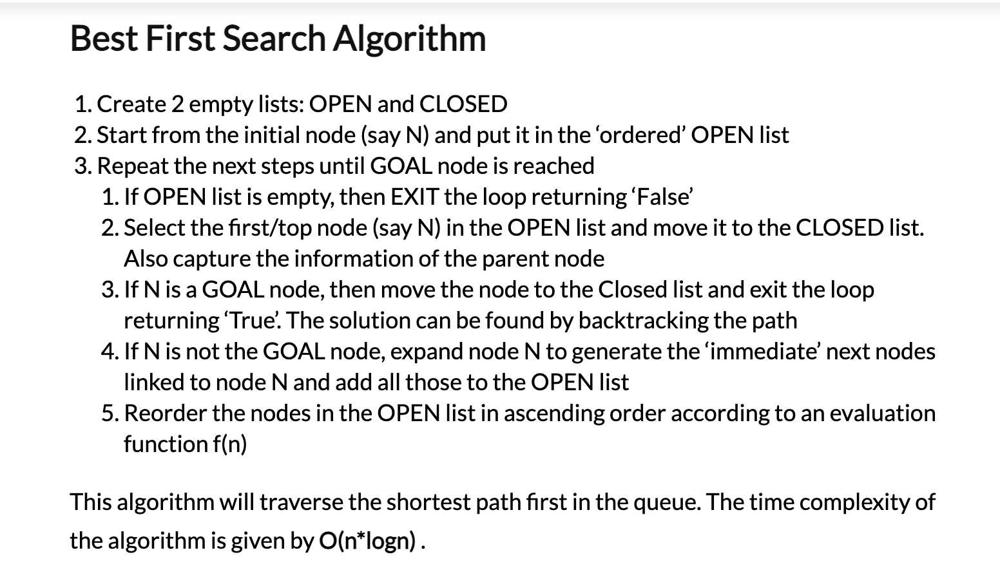



### A* Search
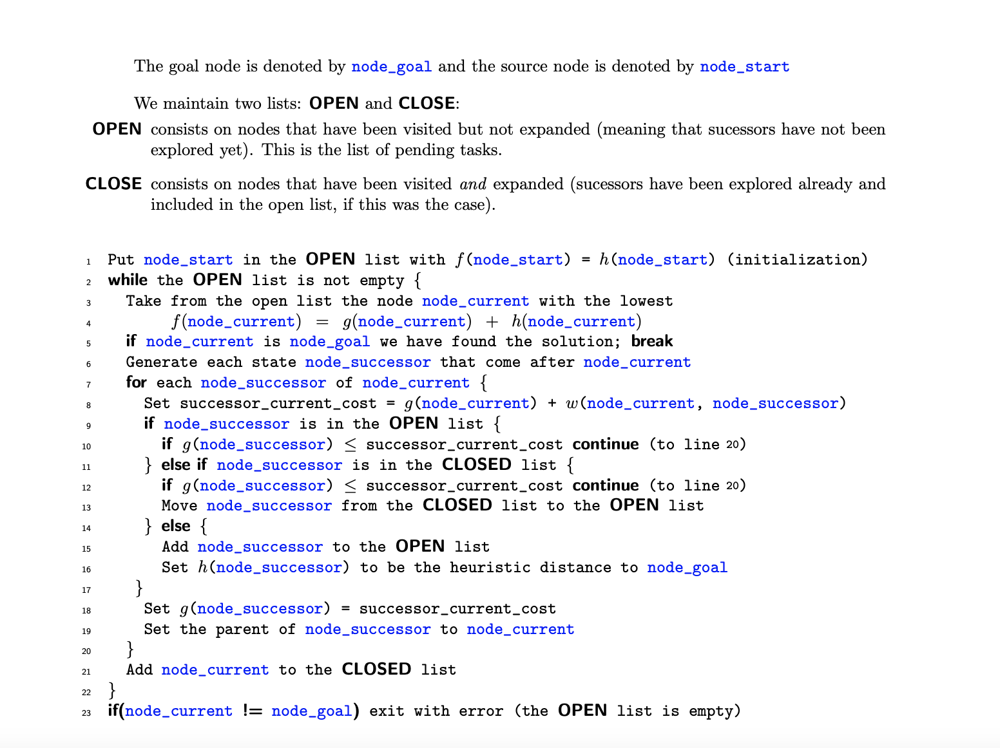

## Code for Best First Search Algorithm

In [34]:
from heapdict import heapdict
def best_first_search(graph, source, dest, graph_n):
    path = []
    visited = [0]*graph_n
    bfs = heapdict()
    bfs[source] = 0
    parent_node = {}
    parent_node[source] = -1
    while bfs:
        current_node = bfs.peekitem()
        path.append(current_node[0])
        if current_node[0] == dest:
            break
        for node, cost in graph[current_node[0]]:
            if(visited[node] == 0 and node not in path):
                bfs[node] = cost
                parent_node[node] = current_node[0]
        #print("Before Deletion: ", bfs.items())
        del_nodes = []
        for node in bfs.keys():
            if parent_node[current_node[0]] == parent_node[node]:
                del_nodes.append(node)
        for node in del_nodes:
            bfs.pop(node)
        visited[current_node[0]] = 1
        #print("After Deletion: ", bfs.items())
    return path

In [35]:
#Shortest Path from One City to Another City 
num_of_cities = int(input("Enter the number of cities: "))
num_of_routes = int(input("Enter the number of routes: "))
cities_map = [[] for i in range(num_of_cities)]
print("For each route, enter the start index, destination index, and cost: ")
for i in range(num_of_routes):
    city1, city2, cost = map(int, input().split())
    print(city1, city2, cost)
    cities_map[city1].append((city2, cost))
    cities_map[city2].append((city1, cost))
#print(cities_map[0])
start_city = int(input("Enter the index of the city you would like to depart from: "))
dest_city = int(input("Enter the index of the city you would like to reach: "))
print("The Shortest Path from City ", start_city, " and City ", dest_city, " is: \n", (best_first_search(cities_map, start_city, dest_city, num_of_cities)))

For each route, enter the start index, destination index, and cost: 
0 7 1
0 1 2
0 2 6
2 3 2
2 4 4
3 7 2
3 5 5
4 6 3
4 9 3
5 6 4
6 8 1
9 8 1
The Shortest Path from City  0  and City  6  is: 
 [0, 7, 3, 2, 4, 6]


## Results for Best First Search - Finding the Shortest Path From One City to Another

We have successfully implemented Best First Search to solve this problem.

- Graph Input:
    - 0 7 1
    - 0 1 2
    - 0 2 6
    - 2 3 2
    - 2 4 4
    - 3 7 2
    - 3 5 5
    - 4 6 3
    - 4 9 3
    - 5 6 4
    - 6 8 1
    - 9 8 1
- Start City: 0 
- End City: 6
- Shortest Path: [0, 7, 3, 2, 4, 6]

#### Graph Visualization
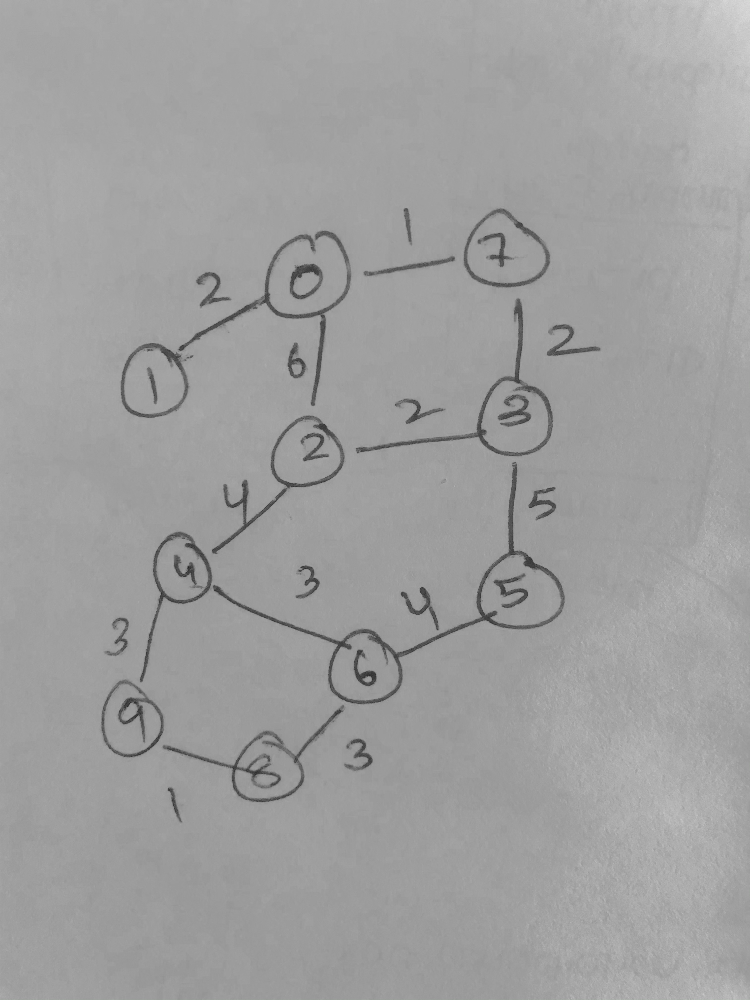

## Code for A* Search Algorithm

In [48]:
from heapdict import heapdict
import math
import random 
class Node():
    def __init__(self, position):
        self.cost = self.setCost()
        self.x = position[0]
        self.y = position[1]
        self.visited = False
    def setCost(self):
        c = random.randint(0, 500)
        c = c%3
        if c == 0:
            return 3
        if c == 1:
            return 2
        if c == 2:
            return 1
    def getCost(self):
        return self.cost
    def setVisited(self):
        self.visited = True
        self.cost = "V"
    def getVisited(self):
        return self.visited
    def display(self):
        if self.cost == "V":
            print("\033[1;36;47m" + "[" + str(self.cost) + "]" + "\033[0;0m", end = ' ')
        else:
            print("[" + str(self.cost) + "]", end = ' ')

def distance(start, goal):
    D = 1
    D2 = math.sqrt(2)
    dx = abs(start[0] - goal[0])
    dy = abs(start[1] - goal[1])
    return D * (dx + dy) + (D2 - 2 * D) * min(dx, dy)

def findAdj(graph, node):
    x = node.x
    y = node.y
    adj = []
    for r,c in [(x+i,y+j) for i in (-1,0,1) for j in (-1,0,1)]:
        if r < len(graph) and c < len(graph[0]):
            adj.append(graph[r][c])
    return adj

In [51]:
def A_search(graph, source, dest, source_coord, dest_coord):
    bfs = heapdict()
    bfs[source] = 0
    parent_node = {}
    parent_node[source] = -1
    path = []
    while bfs:
        current_node = bfs.peekitem()
        path.append([current_node[0].x, current_node[0].y])
        if current_node[0] == dest:
            current_node[0].setVisited()
            break
        adjnodes = findAdj(graph, current_node[0])
        for node in adjnodes:
            #print(node.x, node.y)
            if(not node.getVisited() and [node.x, node.y] not in path):
                bfs[node] = distance([current_node[0].x, current_node[0].y], [node.x, node.y]) + distance([node.x, node.y], dest_coord) + (node.cost/2)
                parent_node[node] = current_node[0]
        #print("Before Deletion: ", bfs.values())
        del_nodes = []
        for node in bfs.keys():
            if parent_node[current_node[0]] == parent_node[node]:
                del_nodes.append(node)
        for node in del_nodes:
            bfs.pop(node)
        current_node[0].setVisited()
        #print("After Deletion: ", bfs.values())
    return path

In [56]:
#Create Grid Map
size = [int(x) for x in input("Enter the dimensions of the grid map in x y form: ").split()]
grid_map = []
print("\nGRID MAP: \n")
print("col:    ", end = '')
for i in range(size[1]):
    print(i, end = '   ')
print()
print()
for i in range(size[0]):
    row = []
    print("row " + str(i) + ": ", end = "")
    for j in range(size[1]):
        col = Node([i, j])
        row.append(col)
        col.display()
    print()
    print()
    grid_map.append(row)
print()
#Choose Start Position >>>> Destination Position
start_coord = [int(x) for x in input("Enter the coordinates of the start position in x y form: ") if x.isnumeric()]
dest_coord = [int(x) for x in input("Enter the coordinates of the destination position in x y form: ") if x.isnumeric()]
print(".....Finding Least Costly Path.....\n\n")
path = A_search(grid_map, grid_map[start_coord[0]][start_coord[1]], grid_map[dest_coord[0]][dest_coord[1]], start_coord, dest_coord)
print()
print(path)
print("\n\nGRID MAP: \n")
print("col:    ", end = '')
for i in range(size[1]):
    print(i, end = '   ')
print()
print()
count = 0
for i in grid_map:
    print("row " + str(count) + ": ", end = "")
    for j in i:
        j.display()
    print()
    print()
    count += 1
print()
print()

Enter the dimensions of the grid map in x y form: 10 10

GRID MAP: 

col:    0   1   2   3   4   5   6   7   8   9   

row 0: [3] [2] [1] [3] [3] [3] [1] [2] [2] [3] 

row 1: [2] [2] [3] [1] [3] [1] [1] [1] [1] [1] 

row 2: [3] [3] [3] [3] [2] [3] [1] [2] [3] [2] 

row 3: [1] [1] [3] [3] [2] [3] [1] [3] [3] [2] 

row 4: [3] [2] [3] [1] [1] [2] [1] [1] [2] [3] 

row 5: [1] [2] [1] [2] [1] [2] [1] [3] [3] [3] 

row 6: [3] [3] [3] [2] [2] [3] [2] [2] [2] [3] 

row 7: [1] [1] [2] [3] [3] [3] [1] [3] [3] [3] 

row 8: [3] [2] [3] [3] [2] [3] [3] [2] [2] [1] 

row 9: [3] [1] [2] [3] [1] [1] [1] [3] [3] [3] 


Enter the coordinates of the start position in x y form: 5 7
Enter the coordinates of the destination position in x y form: 3 9
.....Finding Least Costly Path.....



[[5, 7], [4, 8], [3, 9]]


GRID MAP: 

col:    0   1   2   3   4   5   6   7   8   9   

row 0: [3] [2] [1] [3] [3] [3] [1] [2] [2] [3] 

row 1: [2] [2] [3] [1] [3] [1] [1] [1] [1] [1] 

row 2: [3] [3] [3] [3] [2] [3] [1] [

## Results for A* Search - Finding the Least Costly Path in Terrain With Various Elevations

We have successfully implemented A* Search to solve this problem.

### More Solutions:
(1)

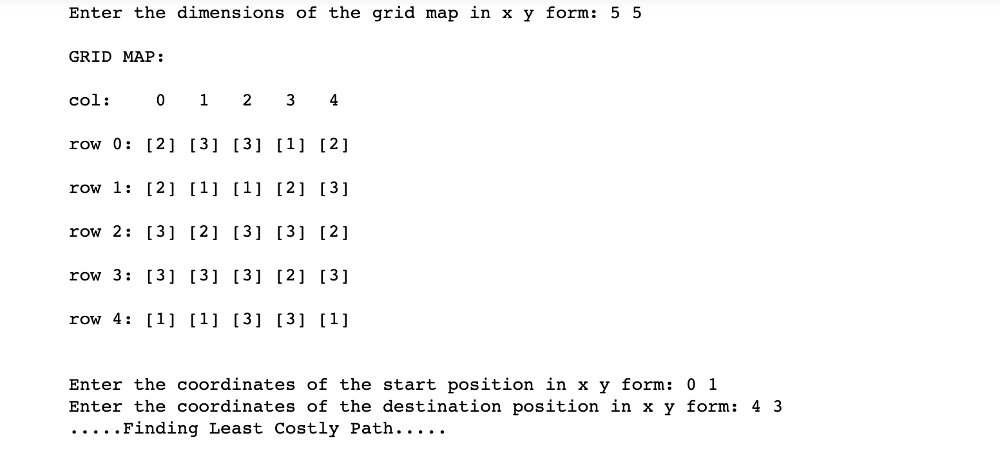
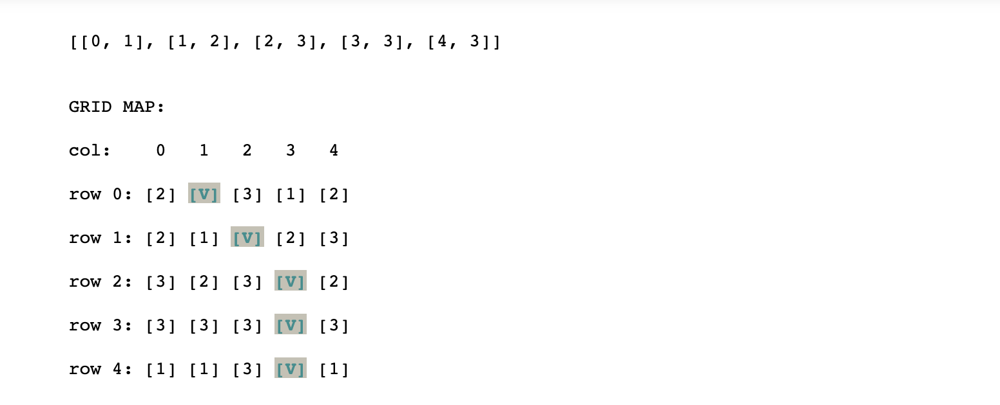

(2)
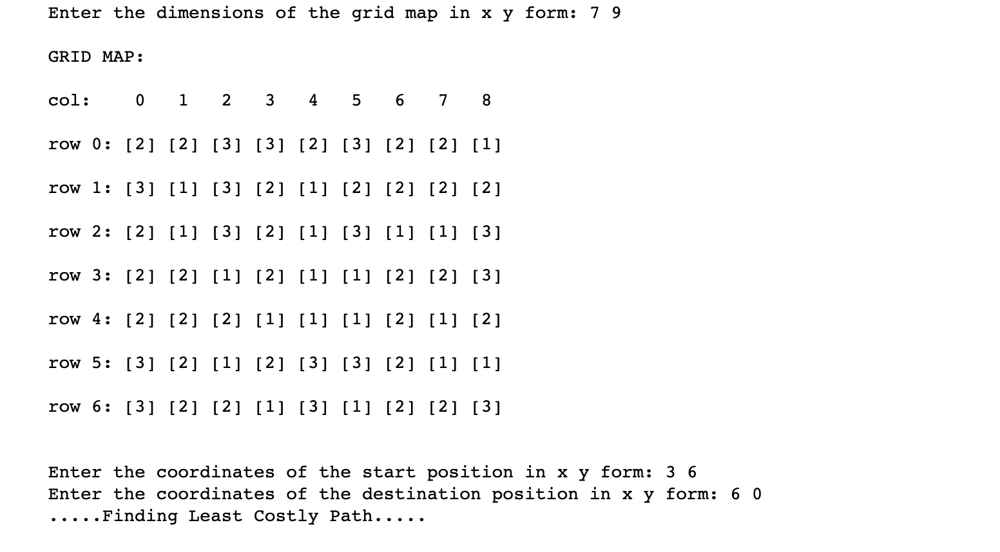
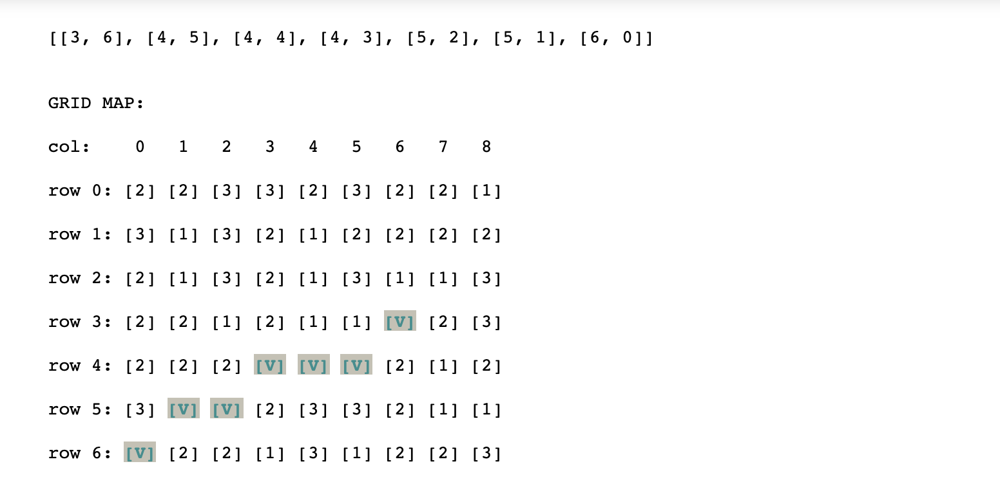
